# Понижение размерности

**1. Иероглифы.** Чтобы немного соригинальничать, воспользуемся не МНИСТом, а его аналогом с иероглифами. Скачайте обрезанную версию с 10 классами
https://github.com/rois-codh/kmnist

Изобразите по несколько представителей каждого класса, предположите, какие из них будет сложнее различить.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


In [2]:
def load(f):
    return np.load(f)['arr_0']

# Load the data
x_train = load('kmnist-train-imgs.npz')
x_test = load('kmnist-test-imgs.npz')
y_train = load('kmnist-train-labels.npz')
y_test = load('kmnist-test-labels.npz')
x_train.shape

(60000, 28, 28)

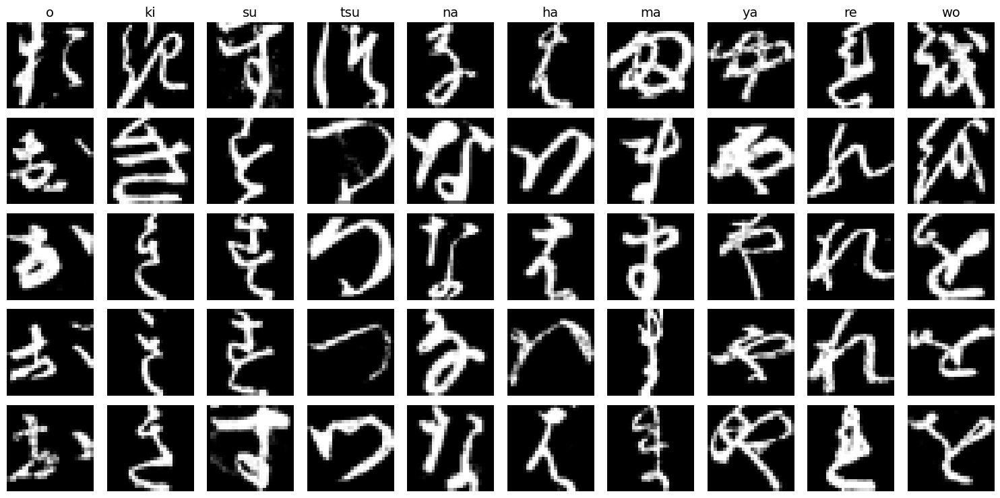

In [17]:
labels_map = ["o", "ki", "su", "tsu", "na", "ha", "ma", "ya", "re", "wo"]

num_classes = 10
samples_per_class = 5

plt.figure(figsize=(15, 7.5))

for y in range(num_classes):
    idxs = np.flatnonzero(y_train == y)

    idxs = np.random.choice(idxs, samples_per_class, replace=False)

    for i, idx in enumerate(idxs):
        plt_idx = i * num_classes + y + 1
        plt.subplot(samples_per_class, num_classes, plt_idx)

        plt.imshow(x_train[idx], cmap="gray")
        plt.axis("off")

        if i == 0:
            plt.title(labels_map[y], fontsize=14)

plt.tight_layout()
plt.show()

**2. Бэйзлайн.** В качестве бэйзлайна обучите на сырых данных:
   - KNN
   - Случайный лес
   - Давайте LDA еще сюда добавим.
  
     Переберите гиперпараметры, для выбранных моделей постройте confusion матрицы, выведите `accuracy_score`. По матрицам определите 3 пары иероглифов, которые алгоритм путает чаще всего. Нарисуйте несколько ошибочно классифицированных представителей этих классов.

     Объясните, почему LDA так плох.

In [18]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix
import seaborn as sns

X_train_flat = x_train.reshape(x_train.shape[0], -1)
X_test_flat = x_test.reshape(x_test.shape[0], -1)

X_train_flat = X_train_flat / 255.0
X_test_flat = X_test_flat / 255.0

In [ ]:
results = {}
best_models = {}

print("Подбор параметров для KNN...")
knn = KNeighborsClassifier()
knn_params = {'n_neighbors': [3, 5, 7]}
knn_grid = GridSearchCV(knn, knn_params, cv=3, n_jobs=-1, verbose=1)
knn_grid.fit(X_train_flat, y_train)

best_models['KNN'] = knn_grid.best_estimator_
results['KNN'] = knn_grid.best_score_
print(f"KNN Best Params: {knn_grid.best_params_}")


print("\nПодбор параметров для Random Forest...")
rf = RandomForestClassifier(random_state=42)
rf_params = {
    'n_estimators': [100, 200],
    'max_depth': [None, 15, 20],
    'min_samples_split': [2, 5]
}
rf_grid = RandomizedSearchCV(rf, rf_params, n_iter=5, cv=3, n_jobs=-1, random_state=42, verbose=1)
rf_grid.fit(X_train_flat, y_train)

best_models['RF'] = rf_grid.best_estimator_
results['RF'] = rf_grid.best_score_
print(f"RF Best Params: {rf_grid.best_params_}")


print("\nОбучение LDA...")
lda = LinearDiscriminantAnalysis()
lda_params = {'solver': ['svd', 'lsqr']}
lda_grid = GridSearchCV(lda, lda_params, cv=3, n_jobs=-1)
lda_grid.fit(X_train_flat, y_train)

best_models['LDA'] = lda_grid.best_estimator_
results['LDA'] = lda_grid.best_score_
print(f"LDA Best Params: {lda_grid.best_params_}")

Подбор параметров для KNN (это может занять время)...
Fitting 3 folds for each of 3 candidates, totalling 9 fits
KNN Best Params: {'n_neighbors': 3}

Подбор параметров для Random Forest...
Fitting 3 folds for each of 5 candidates, totalling 15 fits
RF Best Params: {'n_estimators': 200, 'min_samples_split': 2, 'max_depth': 20}

Обучение LDA...
LDA Best Params: {'solver': 'svd'}


--- KNN ---
Accuracy: 0.9143


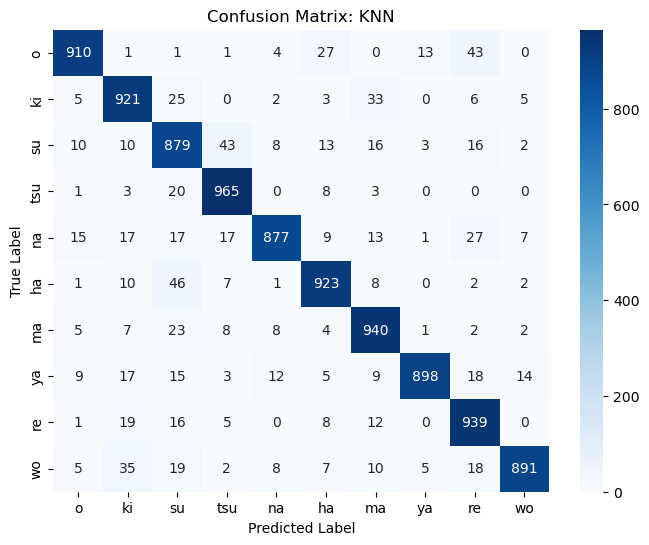

--- RF ---
Accuracy: 0.8611


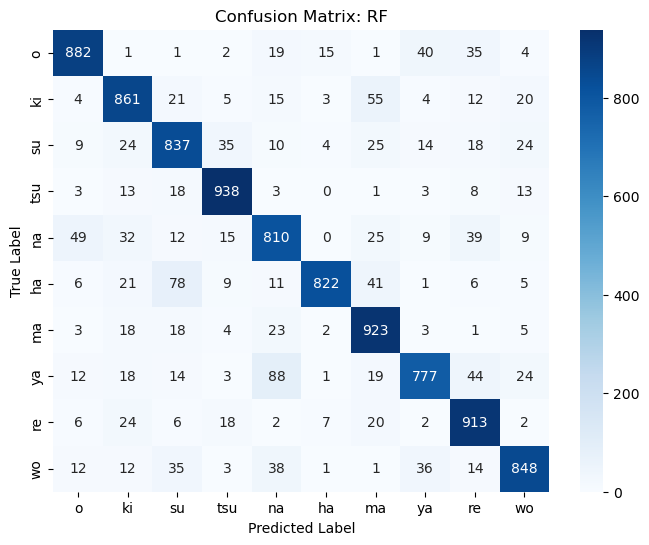

--- LDA ---
Accuracy: 0.5890


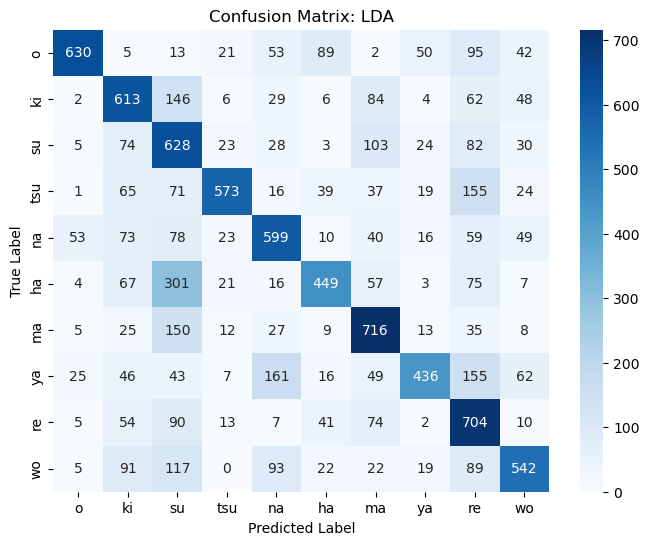

In [19]:
def analyze_model(name, model, X_test, y_test):
    print(f"--- {name} ---")
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    print(f"Accuracy: {acc:.4f}")

    cm = confusion_matrix(y_test, y_pred)

    plt.figure(figsize=(8, 6))
    sns.heatmap(
        cm, annot=True, fmt="d", cmap="Blues", xticklabels=labels_map, yticklabels=labels_map
    )
    plt.title(f"Confusion Matrix: {name}")
    plt.ylabel("True Label")
    plt.xlabel("Predicted Label")
    plt.show()

    return y_pred, cm


predictions = {}
cms = {}

for name, model in best_models.items():
    pred, cm = analyze_model(name, model, X_test_flat, y_test)
    predictions[name] = pred
    cms[name] = cm

In [20]:
def find_top_errors(cm):
    cm_no_diag = cm.copy()
    np.fill_diagonal(cm_no_diag, 0)

    top3_flat_indices = np.argsort(cm_no_diag.flatten())[-3:][::-1]

    top3_pairs = [np.unravel_index(idx, cm.shape) for idx in top3_flat_indices]

    return top3_pairs


for model_name, cm in cms.items():
    print(f"Модель: {model_name}")
    print("-" * 30)

    top_pairs = find_top_errors(cm)

    for true_idx, pred_idx in top_pairs:
        count = cm[true_idx, pred_idx]
        true_label = labels_map[true_idx]
        pred_label = labels_map[pred_idx]

        print(f"True: {true_label:<3} -> Pred: {pred_label:<3} (Ошибок: {count})")

    print("\n")

Модель: KNN
------------------------------
True: ha  -> Pred: su  (Ошибок: 46)
True: su  -> Pred: tsu (Ошибок: 43)
True: o   -> Pred: re  (Ошибок: 43)


Модель: RF
------------------------------
True: ya  -> Pred: na  (Ошибок: 88)
True: ha  -> Pred: su  (Ошибок: 78)
True: ki  -> Pred: ma  (Ошибок: 55)


Модель: LDA
------------------------------
True: ha  -> Pred: su  (Ошибок: 301)
True: ya  -> Pred: na  (Ошибок: 161)
True: tsu -> Pred: re  (Ошибок: 155)




**3. Метод главных компонент.** Обучите sklearn-овский PCA. Не забудьте про масштабирование. К сожалению там уже максимально облегчили вам задачу по выбору числа компонент, но мы все равно порисуем картинки.
   - картинка 1: по оси х - число учтенных компонент, по оси у - процент дисперсии, за который они отвечают. Будьте готовы объяснить, как вычисляется этот процент дисперсии, хоть sklearn и вычислил его за вас
   - картинка 2: скэттер-плот на 2 (или 3, если вы в смелом настроении!) главные компоненты, так, чтоб было понятно, какая точка к какому классу относится. Плотить можно какое-то меньшее подмножество, просто смотрите, чтоб в нем хотя бы все классы были одинаково представлены
  
Обучите снова те же алгоритмы (возможно, с другими гиперпараметрами), сравните результаты.

Что вообще делает PCA? Почему важно стандаризировать данные? 

*Есть стандартная рекомендация о том, чтобы выбирать столько компонент, которые объясняют 95% дисперсии. Рекомендуется поэкспериментировать с выбором куда меньшего их числа. Альтернативная рекомендация - поиск "локтя" на картинке 1, но здесь он не очень острый*

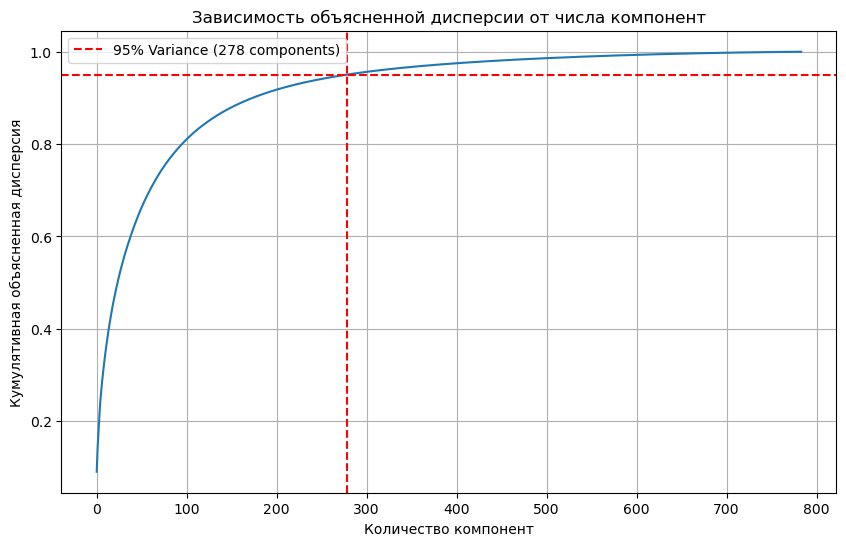

Для сохранения 95% дисперсии нужно 278 компонент из 784.


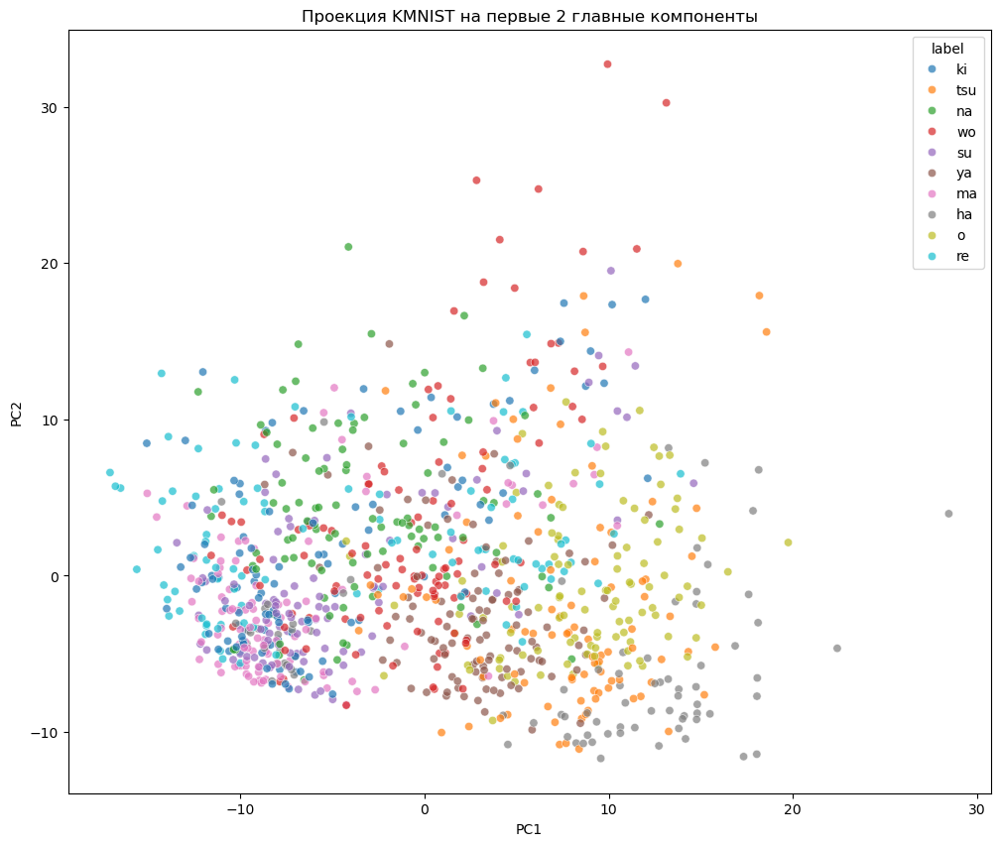

In [21]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_flat)
X_test_scaled = scaler.transform(X_test_flat)

pca_full = PCA().fit(X_train_scaled)

plt.figure(figsize=(10, 6))
plt.plot(np.cumsum(pca_full.explained_variance_ratio_))
plt.xlabel("Количество компонент")
plt.ylabel("Кумулятивная объясненная дисперсия")
plt.title("Зависимость объясненной дисперсии от числа компонент")
plt.grid(True)

n_95 = np.argmax(np.cumsum(pca_full.explained_variance_ratio_) >= 0.95) + 1
plt.axvline(n_95, color="r", linestyle="--", label=f"95% Variance ({n_95} components)")
plt.axhline(0.95, color="r", linestyle="--")
plt.legend()
plt.show()

print(f"Для сохранения 95% дисперсии нужно {n_95} компонент из 784.")

X_pca_2d = pca_full.transform(X_train_scaled)[:, :2]

subset_idx = np.random.choice(len(y_train), 1000, replace=False)
X_subset = X_pca_2d[subset_idx]
y_subset = y_train[subset_idx]

df_pca = pd.DataFrame(data=X_subset, columns=["PC1", "PC2"])
df_pca["label"] = [labels_map[i] for i in y_subset]

plt.figure(figsize=(12, 10))
sns.scatterplot(
    x="PC1", y="PC2", hue="label", palette="tab10", data=df_pca, legend="full", alpha=0.7
)
plt.title("Проекция KMNIST на первые 2 главные компоненты")
plt.show()

In [ ]:
pca = PCA(n_components=0.95)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

print(f"Новая размерность: {X_train_pca.shape}")

results_pca = {}
models_pca = {}

print("Обучение KNN на PCA...")
knn_pca = KNeighborsClassifier(n_neighbors=5)
knn_pca.fit(X_train_pca, y_train)
y_pred_knn = knn_pca.predict(X_test_pca)
results_pca["KNN"] = accuracy_score(y_test, y_pred_knn)

print("Обучение RF на PCA...")
rf_pca = RandomForestClassifier(n_estimators=100, random_state=42)
rf_pca.fit(X_train_pca, y_train)
y_pred_rf = rf_pca.predict(X_test_pca)
results_pca["RF"] = accuracy_score(y_test, y_pred_rf)

print("Обучение LDA на PCA...")
lda_pca = LinearDiscriminantAnalysis()
lda_pca.fit(X_train_pca, y_train)
y_pred_lda = lda_pca.predict(X_test_pca)
results_pca["LDA"] = accuracy_score(y_test, y_pred_lda)

print("\nСравнение Accuracy (Raw vs PCA):")
print(f"{'Model':<10} | {'Raw Data':<10} | {'PCA (95%)':<10} | {'Change'}")
print("-" * 45)

for name in ["KNN", "RF", "LDA"]:
    raw_acc = results.get(name, 0.0)
    pca_acc = results_pca[name]
    diff = pca_acc - raw_acc
    print(f"{name:<10} | {raw_acc:.4f}     | {pca_acc:.4f}     | {diff:+.4f}")

Новая размерность: (60000, 278)
Обучение KNN на PCA...
Обучение RF на PCA...
Обучение LDA на PCA...

Сравнение Accuracy (Raw vs PCA):
Model      | Raw Data   | PCA (95%)  | Change
---------------------------------------------
KNN        | 0.9615     | 0.8998     | -0.0617
RF         | 0.9379     | 0.7936     | -0.1443
LDA        | 0.7578     | 0.5909     | -0.1669


**4. UMAP.** Первые две главные компоненты вряд ли позволили получить какой-то вразумительный график. Попытаем счастья с UMAP-ом. Его придется установить отдельно (https://umap-learn.readthedocs.io/en/latest/basic_usage.html). Поскольку это нужно нам только для визуализации, обучить его можете на тестовых данных, а может и на каком-то их подмножестве - потому что памяти, вероятно, будет не хватать... (это та часть лабы, которую я сама делать не пробовала)

In [14]:
%pip install umap-learn

Note: you may need to restart the kernel to use updated packages.


Запуск UMAP на 10000 примерах...


/home/andron/miniconda3/lib/python3.13/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Готово. Размерность эмбеддинга: (10000, 2)


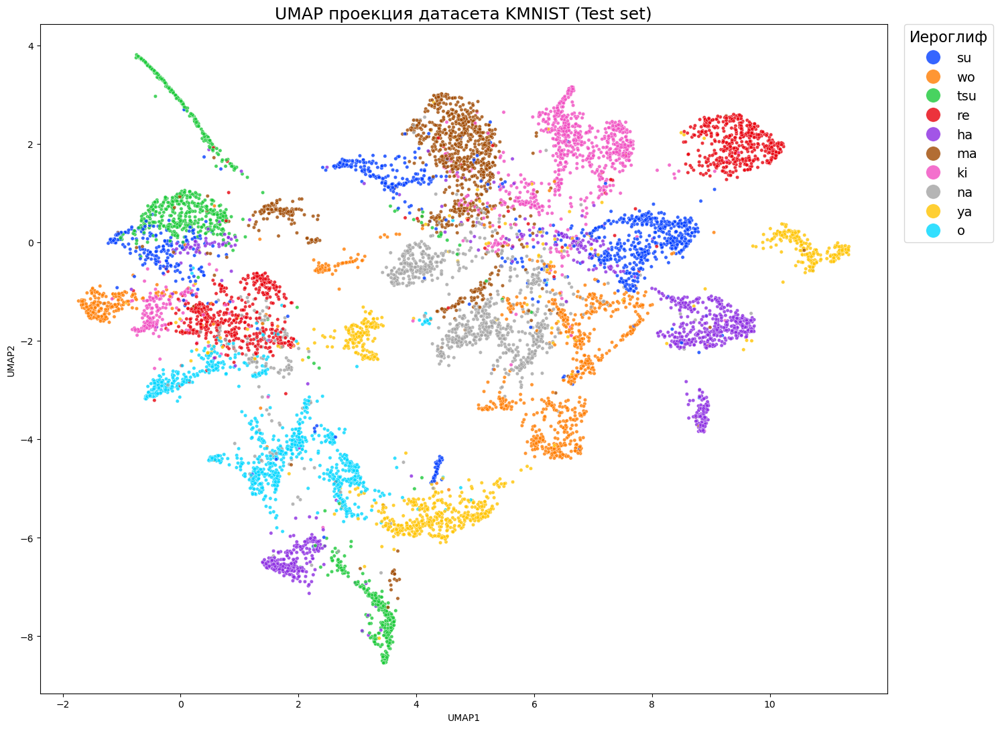

In [22]:
import umap


X_test_flat = x_test.reshape(x_test.shape[0], -1)

X_test_norm = X_test_flat / 255.0

print(f"Запуск UMAP на {X_test_norm.shape[0]} примерах...")

reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, random_state=42, n_jobs=-1)
embedding = reducer.fit_transform(X_test_norm)

print("Готово. Размерность эмбеддинга:", embedding.shape)

df_umap = pd.DataFrame(data=embedding, columns=["UMAP1", "UMAP2"])
df_umap["label_idx"] = y_test
labels_map = ["o", "ki", "su", "tsu", "na", "ha", "ma", "ya", "re", "wo"]
df_umap["Character"] = df_umap["label_idx"].apply(lambda x: labels_map[x])


plt.figure(figsize=(15, 11))

custom_palette = sns.color_palette("bright", 10)

sns.scatterplot(
    x="UMAP1",
    y="UMAP2",
    hue="Character",
    palette=custom_palette,
    data=df_umap,
    legend="full",
    alpha=0.8,
    s=15,
)

plt.title("UMAP проекция датасета KMNIST (Test set)", fontsize=18)

plt.legend(
    bbox_to_anchor=(1.02, 1),
    loc=2,
    borderaxespad=0.0,
    markerscale=4,
    fontsize=14,
    title="Иероглиф",
    title_fontsize=16,
)

plt.tight_layout()
plt.show()

**5. Kernel PCA.** Хотелось бы попробовать ядерный PCA на тех же данных, но тут опять можно столкнуться с нехваткой памяти (объясните, почему с обычным РСА такой проблемы не было). Однако поиграться с ядрами все-таки хочется, так что сделаем это хотя бы на синтетических датасетах. Признаков у нас тут и так немного, однако границы между классами / зависимость получаются совсем не линейные - хотя на глаз и вполне понятные. Конечно, KNN с этим бы справился без проблем, но мы тут хотим просто проследить, что разные ядра способны улавливать и распрямлять. Для каждого датасета из файла:

- изобразите его исходную версию. Раскрасьте в соответствии со значением целевой переменной (она всегда в последнем столбце)
- примените каждое из доступных в `KernelPCA` ядер (в некоторых можно попробовать разные значения параметров), получите главные компоненты
- примените какое-нибудь недоступное в `KernelPCA` ядро (подайте в качестве аргумента callable. Примеры неупомянутых в sklearn, но стандартных ядер: exponential, laplacian; ну и, вдохновившись обобщенным RBF ядром вы можете придумать совершенно уникальное ядро имени вас любимых)
- для каждого использованного ядра изобразите данные в пространстве выделенных главных компонент (3D - или 2D, если в нем тоже красиво)

*Для некоторых датасетов может и не выйдет ничего хорошего, это нормально. Данные, опять же, рекомендуется стандартизировать.*

In [24]:
%pip install openpyxl

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [openpyxl]
Note: you may need to restart the kernel to use updated packages.


In [25]:
xl = pd.ExcelFile('pcadata.xlsx')
xl.sheet_names

/home/andron/miniconda3/lib/python3.13/site-packages/openpyxl/styles/stylesheet.py:237: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


['Ellipsoid',
 'SwissRoll',
 'Helix',
 'RBFlike',
 'Concentric',
 'Concentric3D',
 'Egg',
 'Tori']

In [26]:
data = xl.parse('Concentric', header=None, names=['x1','x2','x3','y'])
data.head()

,x1,x2,x3,y
0,4.734711,-1.837692,-0.003815,0
1,-3.427737,-3.613319,-0.026391,0
2,4.853116,0.634650,0.233483,0
3,3.671342,3.326125,-0.011691,0
4,-4.266282,-2.723293,-0.037582,0


/home/andron/miniconda3/lib/python3.13/site-packages/openpyxl/styles/stylesheet.py:237: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


Обработка датасета: Ellipsoid...


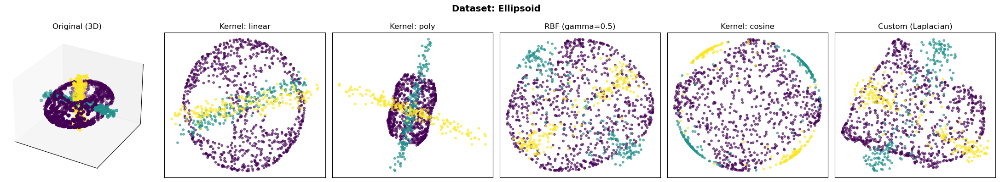

Обработка датасета: SwissRoll...


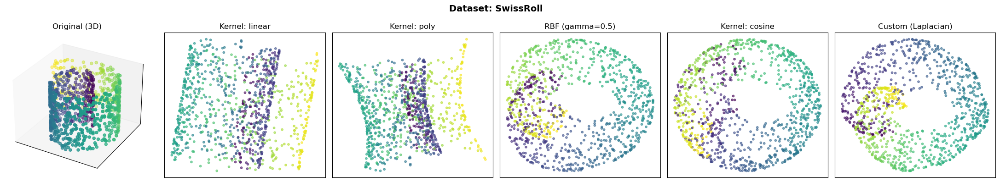

Обработка датасета: Helix...


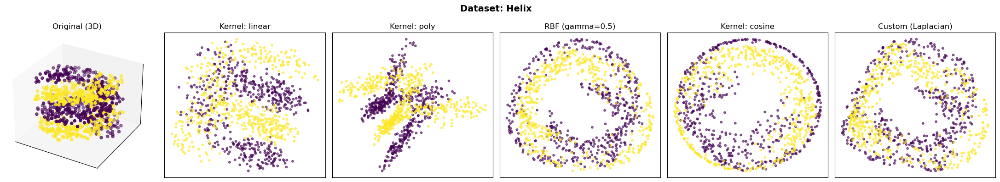

Обработка датасета: RBFlike...


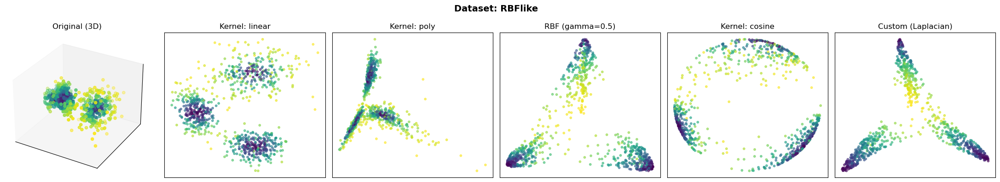

Обработка датасета: Concentric...


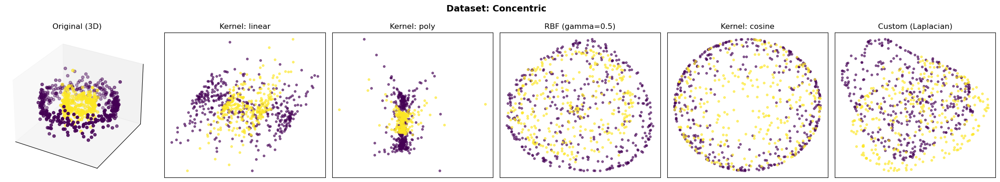

Обработка датасета: Concentric3D...


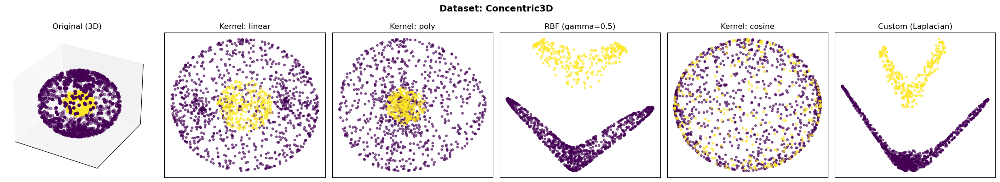

Обработка датасета: Egg...


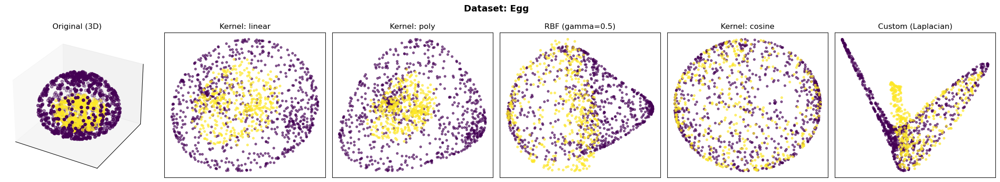

Обработка датасета: Tori...


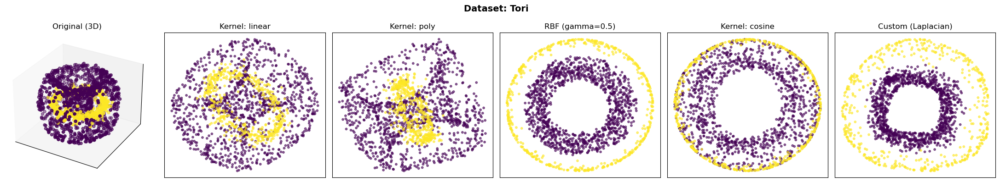

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import KernelPCA
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics.pairwise import manhattan_distances


def get_laplacian_gram_matrix(X, gamma=0.5):
    dists = manhattan_distances(X, X)
    return np.exp(-gamma * dists)


xl = pd.ExcelFile("pcadata.xlsx")

kernels_to_test = ["linear", "poly", "rbf", "cosine", "precomputed"]

for sheet in xl.sheet_names:
    print(f"Обработка датасета: {sheet}...")

    df = xl.parse(sheet, header=None, names=["x1", "x2", "x3", "y"])
    X = df[["x1", "x2", "x3"]].values
    y_raw = df["y"].values

    le = LabelEncoder()
    y = le.fit_transform(y_raw)

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    fig = plt.figure(figsize=(22, 4))
    plt.suptitle(f"Dataset: {sheet}", fontsize=14, fontweight="bold")

    ax = fig.add_subplot(1, len(kernels_to_test) + 1, 1, projection="3d")
    ax.scatter(X_scaled[:, 0], X_scaled[:, 1], X_scaled[:, 2], c=y, cmap="viridis", s=20)
    ax.set_title("Original (3D)")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])

    for i, kernel_name in enumerate(kernels_to_test):
        ax = fig.add_subplot(1, len(kernels_to_test) + 1, i + 2)

        try:
            if kernel_name == "precomputed":
                K_matrix = get_laplacian_gram_matrix(X_scaled, gamma=1.0)

                kpca = KernelPCA(n_components=2, kernel="precomputed")
                X_kpca = kpca.fit_transform(K_matrix)
                title = "Custom (Laplacian)"

            elif kernel_name == "rbf":
                kpca = KernelPCA(n_components=2, kernel="rbf", gamma=0.5)
                X_kpca = kpca.fit_transform(X_scaled)
                title = "RBF (gamma=0.5)"

            else:
                kpca = KernelPCA(n_components=2, kernel=kernel_name)
                X_kpca = kpca.fit_transform(X_scaled)
                title = f"Kernel: {kernel_name}"

            ax.scatter(X_kpca[:, 0], X_kpca[:, 1], c=y, cmap="viridis", s=10, alpha=0.6)
            ax.set_title(title)
            ax.set_xticks([])
            ax.set_yticks([])

        except Exception as e:
            ax.text(0.5, 0.5, "Error", ha="center")
            print(f"Ошибка с ядром {kernel_name} на листе {sheet}: {e}")

    plt.tight_layout()
    plt.show()

**6. LLE.** Тем, у кого не получилось красивой картинки с `KernelPCA`, еще может помочь LLE. Поперебирайте его параметры, и для каждого датасета изобразите результат, который показался вам наиболее удачным. Какие, на ваш взгляд, есть достоинства и недостатоки у LLE по сравнению с PCA?

In [ ]:
from sklearn.manifold import LocallyLinearEmbedding

/home/andron/miniconda3/lib/python3.13/site-packages/openpyxl/styles/stylesheet.py:237: UserWarning: Workbook contains no default style, apply openpyxl's default
  warn("Workbook contains no default style, apply openpyxl's default")


Обработка датасета: Ellipsoid...


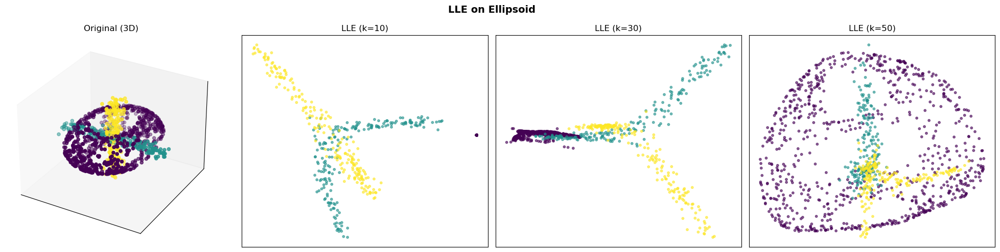

Обработка датасета: SwissRoll...


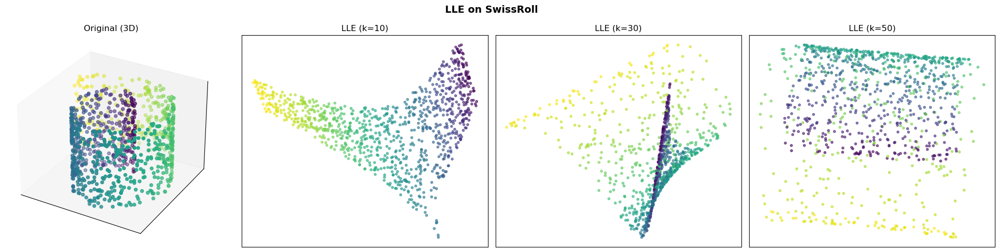

Обработка датасета: Helix...


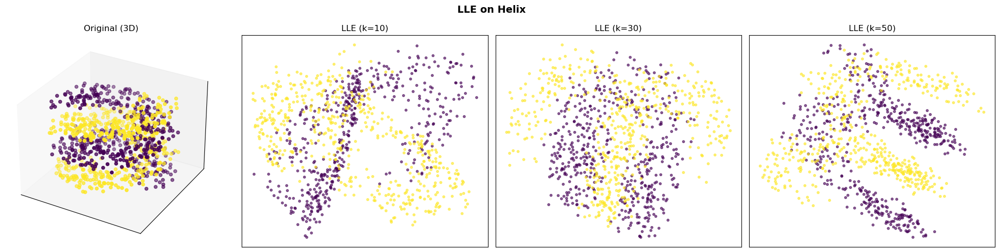

Обработка датасета: RBFlike...


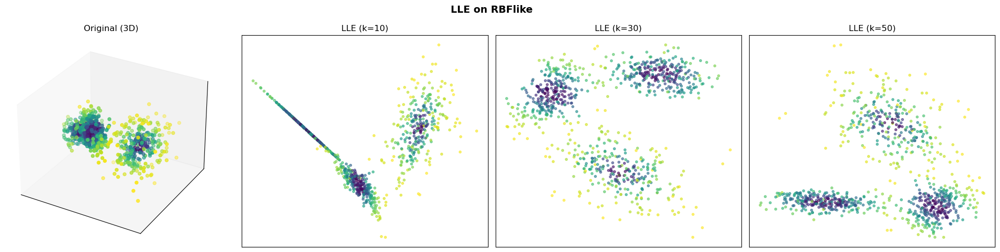

Обработка датасета: Concentric...


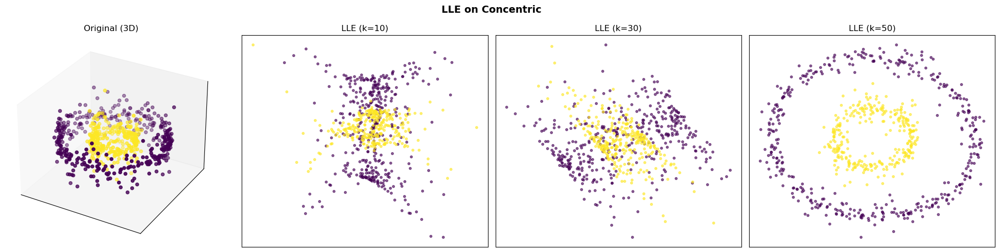

Обработка датасета: Concentric3D...


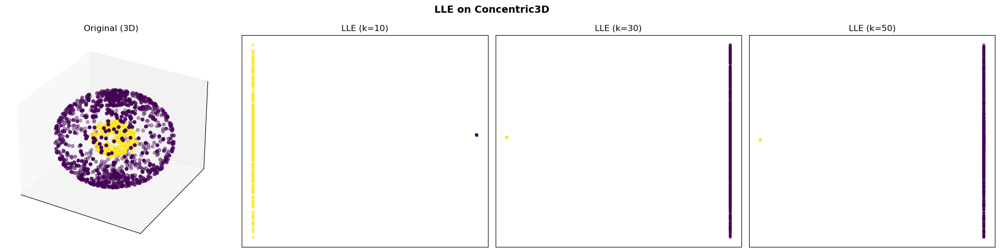

Обработка датасета: Egg...


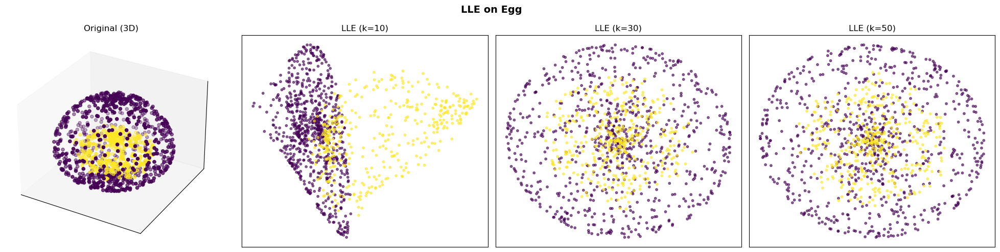

Обработка датасета: Tori...


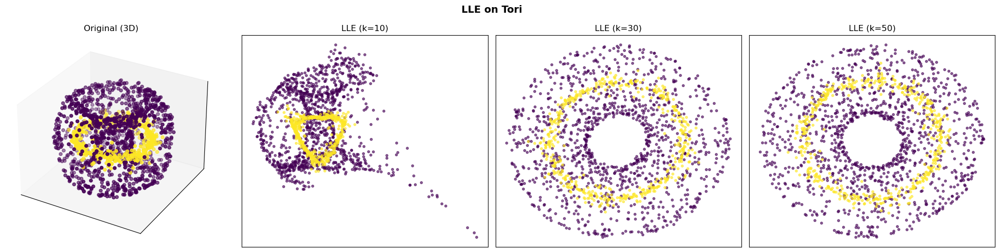

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.manifold import LocallyLinearEmbedding
from sklearn.preprocessing import StandardScaler, LabelEncoder

xl = pd.ExcelFile("pcadata.xlsx")

neighbors_list = [10, 30, 50]

for sheet in xl.sheet_names:
    print(f"Обработка датасета: {sheet}...")

    df = xl.parse(sheet, header=None, names=["x1", "x2", "x3", "y"])
    X = df[["x1", "x2", "x3"]].values
    y_raw = df["y"].values

    le = LabelEncoder()
    y = le.fit_transform(y_raw)

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    fig = plt.figure(figsize=(20, 5))
    plt.suptitle(f"LLE on {sheet}", fontsize=14, fontweight="bold")

    ax = fig.add_subplot(1, len(neighbors_list) + 1, 1, projection="3d")
    ax.scatter(X_scaled[:, 0], X_scaled[:, 1], X_scaled[:, 2], c=y, cmap="viridis", s=20)
    ax.set_title("Original (3D)")
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])

    for i, n_neighbors in enumerate(neighbors_list):
        ax = fig.add_subplot(1, len(neighbors_list) + 1, i + 2)

        try:
            lle = LocallyLinearEmbedding(
                n_neighbors=n_neighbors, n_components=2, method="standard", random_state=42
            )
            X_lle = lle.fit_transform(X_scaled)

            ax.scatter(X_lle[:, 0], X_lle[:, 1], c=y, cmap="viridis", s=10, alpha=0.6)
            ax.set_title(f"LLE (k={n_neighbors})")
            ax.set_xticks([])
            ax.set_yticks([])

        except Exception as e:
            ax.text(0.5, 0.5, "Error", ha="center")
            print(f"Error on k={n_neighbors}: {e}")

    plt.tight_layout()
    plt.show()